# Identify the product category

**Problem Statement**  
The applications of Deep Neural Nets is on a roll. Whether it is healthcare, transportation, or retail, companies across all industries are excited about investing in building intelligent solutions. Meanwhile, let's hope human intelligence remains uncontested.

In this challenge, you will help one of the largest retailers in Germany improve their inventory-management process in its Food and Groceries business. The company is looking for intelligent solutions that can reduce the amount of human effort in its warehouse and retail outlets.

A solution such as a powerful image classifier can help the company track shelf inventory, categorize products, record product volume etc.

You are required to predict the category of each product.

The link to hackerearth competition is here [hackerearth-identify-the-objects](https://www.hackerearth.com/problem/machine-learning/identify-the-objects/).


# Transfer Learning using Keras

This notebook is created from the Keras blog https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html

Training an Image Classification model - even with Deep Learning - is not an easy task. In order to get sufficient accuracy, without overfitting requires a lot of training data. If we try to train a deep learning model from scratch, and hope build a classification system with similar level of capability of an ImageNet-level model, then we'll need a dataset of about a million training examples (plus, validation examples also). Needless to say, it's not easy to acquire, or build such a dataset practically.

Luckily, Deep Learning supports an immensely useful feature called 'Transfer Learning'. Basically, we are able to take a pre-trained deep learning model - which is trained on a large-scale dataset such as ImageNet - and re-purpose it to handle an entirely different problem. The idea is that since the model has already learned certain features from a large dataset, it may be able to use those features as a base to learn the particular classification problem we present it with.

This task is further simplified since popular deep learning models such as InceptioV3 and their pre-trained ImageNet weights are readily available. The Keras framework even has them built-in in the `keras.applications` package.

The basic technique to get transfer learning working is to get a pre-trained model (with the weights loaded) and remove final fully-connected layers from that model. We then use the remaining portion of the model as a feature extractor for our smaller dataset. These extracted features are called "Bottleneck Features" (i.e. the last activation maps before the fully-connected layers in the original model). We then train a small fully-connected network on those extracted bottleneck features in order to get the classes we need as outputs for our problem.

In the blog the author `@fchollet` has discussed at length how to do that. He only used a few training examples but here we will use the entire dataset. In this notebook, we are going to build a classifier for 25 different classes of product images. We only have around 150 images per class, which is nowhere near enough data to train a model from scratch.

Although the Keras Blog is an excellent guide on how to build an image classification system for binary classification ('Cats' and 'Dogs' in their example) using bottleneck features but it does not show how to use the same technique for multi-class classification or how to use the finalized model to make predictions.

Here we will build a multi-class image classifier using bottleneck features in Keras running on TensorFlow and work through on how to use it to predict classes once trained. Furthermore we will also use a technique calle fine-tuning to further tune the customised fully connected layers.

We will go over the following options:

- training a small network from scratch (as a baseline) (previous notebook)
- using the bottleneck features of a pre-trained network (this notebook)
- fine-tuning the top layers of a pre-trained network (this notebook)

We have already structured the images data in the following structure for the Keras ImageDataGenerator to work in our previous notebook.
```
data/
    train/
        beans/
            train_1a.png
            ...
            train_1b.png
        cake/
            train_2a.png
            ...
            train_2b.png
        candy/
        ...
        water
            train_25a.png
            ...
            train_25b.png
    valid/
        beans/
            train_1a.png
            ...
            train_1b.png
        cake/
            train_2a.png
            ...
            train_2b.png
        candy/
        ...
        water
            train_25a.png
            ...
            train_25b.png
    test/
        unknown/
            train_1a.png
            ...
            train_25b.png
```

In [1]:
import math
import numpy as np
import pandas as pd

import pickle

from keras.models import Sequential, Model

from keras.layers.normalization import BatchNormalization
from keras.layers import Input, Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense

from keras.applications.inception_v3 import InceptionV3, preprocess_input

from keras.utils.np_utils import to_categorical
from keras.optimizers import Adam, SGD, rmsprop

from keras.callbacks import EarlyStopping, ReduceLROnPlateau, LearningRateScheduler, ModelCheckpoint, TensorBoard

from keras.preprocessing.image import ImageDataGenerator

from keras import backend as K

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

Using TensorFlow backend.


In [2]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [3]:
# this allows plots to appear directly in the notebook
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
seed = 42
np.random.seed(seed)

## Visualizing a few Training Images

In [5]:
## set path for images
TRAIN_IMG_PATH = 'data/train_img/'
TEST_IMG_PATH = 'data/test_img/'

In [6]:
train_labels_df = pd.read_csv('data/train.csv')
test_labels_df = pd.read_csv('data/test.csv')

In [7]:
train_labels_df.head(5)

,image_id,label
0,train_1a,rice
1,train_1b,candy
2,train_1c,jam
3,train_1d,coffee
4,train_2a,vinegar


In [8]:
test_labels_df.head(5)

,image_id
0,test_1000a
1,test_1000b
2,test_1000c
3,test_1000d
4,test_1001a


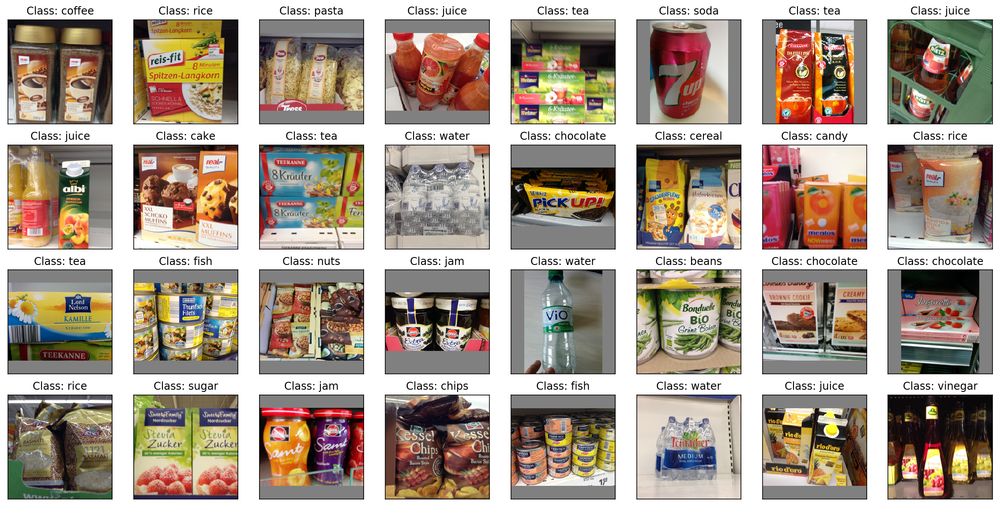

In [9]:
import cv2
fig = plt.figure(figsize=(20, 10))
nrows, ncols = 4, 8
for i, row in enumerate(train_labels_df.sample(nrows * ncols, random_state=seed).itertuples(index=False)):
    ax = fig.add_subplot(nrows, ncols, i + 1, xticks=[], yticks=[])
    img_path, img_label = TRAIN_IMG_PATH + row[0] + '.png', row[1]
    img = cv2.imread(img_path)
    ax.imshow(cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), (256, 256)))
    ax.set_title('Class: {0}'.format(img_label))

## Data pre-processing and data augmentation

In order to make the most of our few training examples, we will "augment" them via a number of random transformations, so that our model would never see twice the exact same picture. This helps prevent overfitting and helps the model generalize better.

In Keras this can be done via the `keras.preprocessing.image.ImageDataGenerator` class. This class allows us to:

- configure random transformations and normalization operations to be done on our image data during training
- instantiate generators of augmented image batches (and their labels) via `.flow(data, labels)` or `.flow_from_directory(directory)`. These generators can then be used with the Keras model methods that accept data generators as inputs, `fit_generator`, `evaluate_generator` and `predict_generator`.

In [10]:
datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        fill_mode='nearest')

In [11]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

img = load_img('data_gen/train/beans/train_8a.png')  # this is a PIL image
img = img_to_array(img)  # this is a Numpy array with shape (256, 256, 3)
img = img.astype(np.float32)
img = np.expand_dims(img, axis =0) # this is a Numpy array with shape (1, 256, 256, 3)

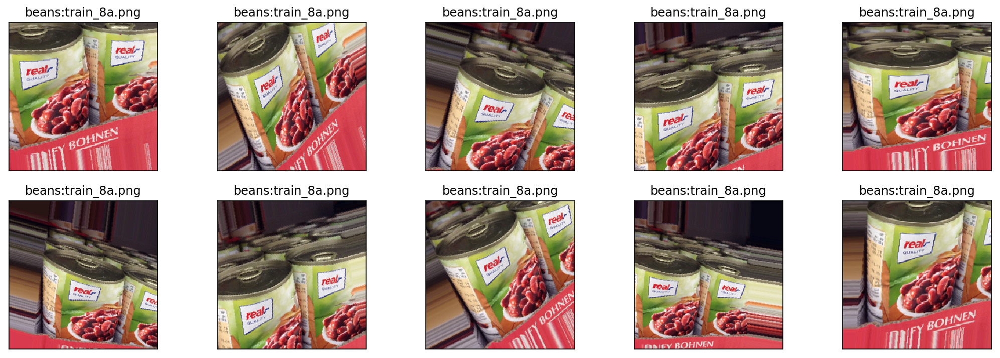

In [12]:
# the .flow() command below generates batches of randomly transformed images
fig = plt.figure(figsize=(18, 6))
for i in range(10):
    ax = fig.add_subplot(2, 5, i + 1, xticks=[], yticks=[])
    aug_image = next(datagen.flow(img))
    ax.imshow(np.squeeze(aug_image, axis=0))
    ax.set_title('beans:train_8a.png')

In [13]:
KERAS_DATAGEN_TRAIN_IMG_PATH = 'data_gen/train/'
KERAS_DATAGEN_VALID_IMG_PATH = 'data_gen/valid/'
KERAS_DATAGEN_TEST_IMG_PATH = 'data_gen/test/'

In [14]:
# dimensions of our images.
IMG_WIDTH, IMG_HEIGHT = 299, 299

In [15]:
if K.image_data_format() == 'channels_first':
    input_shape = (3, IMG_WIDTH, IMG_HEIGHT)
else:
    input_shape = (IMG_WIDTH, IMG_HEIGHT, 3)

## Using the Bottleneck Features of a pre-trained network:

A more refined approach would be to leverage a network pre-trained on a large dataset. Such a network would have already learned features that are useful for most computer vision problems, and leveraging such features would allow us to reach a better accuracy than any method that would only rely on the available data.

We will use the InceptionV3 architecture, pre-trained on the ImageNet dataset. Because the ImageNet dataset contains several categories of pictures the InceptionV3 should have already learn the low level features of the images in the lower convolutional layers and that learning can be used here on this particualr dataset featuring classes absent from ImageNet.

Here's what the InceptionV3 architecture looks like:

![](images/vgg16_original.png)

Our strategy will be as follows: we will only instantiate the convolutional part of the model, everything up to the fully-connected layers. We will then run this model on our training and validation data once, recording the output (the "bottleneck features" from the InceptionV3 model: the last activation maps before the fully-connected layers) in two numpy arrays. Then we will train a small fully-connected model on top of the stored features.

The reason why we are storing the features offline rather than adding our fully-connected model directly on top of a frozen convolutional base and running the whole thing, is computational effiency. Running InceptionV3 is expensive, especially if we're working on CPU, and we want to only do it once. Note that this prevents us from using data augmentation.

### Save the Bottleneck Features:

In [16]:
NB_EPOCHS = 50
BATCH_SIZE = 32

In [17]:
# preprocess_input
datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
#datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=imagenet_utils.preprocess_input)

In [18]:
# build the InceptionV3 network
bottleneck_inceptionv3_base_model = InceptionV3(include_top=False, weights='imagenet', input_shape=input_shape)

In [19]:
train_generator = datagen.flow_from_directory(
        KERAS_DATAGEN_TRAIN_IMG_PATH,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False) # our data will be in order

Found 2154 images belonging to 25 classes.


In [20]:
NB_TRAIN_SAMPLES = len(train_generator.filenames)
NUM_CLASSES = len(train_generator.class_indices)

In [21]:
NB_TRAIN_SAMPLES, NUM_CLASSES

(2154, 25)

In [22]:
# the features were saved in order with shuffle=False, so recreating the labels is easy
train_labels = train_generator.classes
train_labels = to_categorical(train_labels, num_classes=NUM_CLASSES)

In [23]:
# the predict_generator method returns the output of a model, given a generator that yields batches of numpy data
bottleneck_features_train = bottleneck_inceptionv3_base_model.predict_generator(
                                                            train_generator, 
                                                            np.ceil(float(NB_TRAIN_SAMPLES) / float(BATCH_SIZE)))

In [24]:
bottleneck_features_train.shape, train_labels.shape

((2154, 8, 8, 2048), (2154, 25))

In [25]:
# Save the training bottleneck features as a Numpy array
np.save(open('models/bottleneck_features_train.npy', 'wb'), bottleneck_features_train)
np.save(open('models/bottleneck_features_train_labels.npy', 'wb'), train_labels)

In [26]:
validation_generator = datagen.flow_from_directory(
        KERAS_DATAGEN_VALID_IMG_PATH,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False) # our data will be in order

Found 1061 images belonging to 25 classes.


In [27]:
NB_VALID_SAMPLES = len(validation_generator.filenames)

In [28]:
NB_VALID_SAMPLES

1061

In [29]:
# the features were saved in order with shuffle=False, so recreating the labels is easy
validation_labels = validation_generator.classes
validation_labels = to_categorical(validation_labels, num_classes=NUM_CLASSES)

In [30]:
# the predict_generator method returns the output of a model, given a generator that yields batches of numpy data
bottleneck_features_validation = bottleneck_inceptionv3_base_model.predict_generator(
                                                                validation_generator, 
                                                                np.ceil(float(NB_VALID_SAMPLES) / float(BATCH_SIZE)))

In [31]:
bottleneck_features_validation.shape, validation_labels.shape

((1061, 8, 8, 2048), (1061, 25))

In [32]:
np.save(open('models/bottleneck_features_validation.npy', 'wb'), bottleneck_features_validation)
np.save(open('models/bottleneck_features_validation_labels.npy', 'wb'), validation_labels)

**Class Index to Class Name Mapping:**

In [33]:
index_to_class = {v: k for k, v in train_generator.class_indices.items()}
index_to_class

{0: 'beans',
 1: 'cake',
 2: 'candy',
 3: 'cereal',
 4: 'chips',
 5: 'chocolate',
 6: 'coffee',
 7: 'corn',
 8: 'fish',
 9: 'flour',
 10: 'honey',
 11: 'jam',
 12: 'juice',
 13: 'milk',
 14: 'nuts',
 15: 'oil',
 16: 'pasta',
 17: 'rice',
 18: 'soda',
 19: 'spices',
 20: 'sugar',
 21: 'tea',
 22: 'tomatosauce',
 23: 'vinegar',
 24: 'water'}

In [34]:
# save the class names to class indices mapping for use later in predictions

import pickle

with open('models/class_to_index.pickle', 'wb') as f:
    pickle.dump(train_generator.class_indices, f, protocol=pickle.HIGHEST_PROTOCOL)

with open('models/index_to_class.pickle', 'wb') as f:
    pickle.dump(index_to_class, f, protocol=pickle.HIGHEST_PROTOCOL)

### Train a top model over the Bottleneck Features:

We can then load our saved data and train a small fully-connected model:

In [35]:
# the features were saved in order with shuffle=False, so recreating the labels is easy
bottleneck_features_train = np.load(open('models/bottleneck_features_train.npy', 'rb'))
bottleneck_features_train_labels = np.load(open('models/bottleneck_features_train_labels.npy', 'rb'))

p = np.random.permutation(len(bottleneck_features_train))
bottleneck_features_train = bottleneck_features_train[p]
bottleneck_features_train_labels = bottleneck_features_train_labels[p]

# the features were saved in order with shuffle=False, so recreating the labels is easy
bottleneck_features_validation = np.load(open('models/bottleneck_features_validation.npy', 'rb'))
bottleneck_features_validation_labels = np.load(open('models/bottleneck_features_validation_labels.npy', 'rb'))

p = np.random.permutation(len(bottleneck_features_validation))
bottleneck_features_validation = bottleneck_features_validation[p]
bottleneck_features_validation_labels = bottleneck_features_validation_labels[p]

**Create the top model:**

In [36]:
bottleneck_top_input = Input(shape=bottleneck_features_train.shape[1:])
bottleneck_top_network = Flatten(name='top_flatten_1')(bottleneck_top_input)
bottleneck_top_network = Dense(512, activation='relu', name='top_dense_1')(bottleneck_top_network)
bottleneck_top_network = Dropout(0.2, name='top_dropout_1')(bottleneck_top_network)
bottleneck_top_network = Dense(NUM_CLASSES, activation='softmax', name='top_dense_2')(bottleneck_top_network)

In [37]:
bottleneck_features_train.shape, bottleneck_features_train_labels.shape

((2154, 8, 8, 2048), (2154, 25))

In [38]:
bottleneck_features_validation.shape, bottleneck_features_validation_labels.shape

((1061, 8, 8, 2048), (1061, 25))

In [39]:
bottleneck_top_model = Model(inputs=bottleneck_top_input, outputs=bottleneck_top_network)

In [40]:
print(bottleneck_top_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 8, 8, 2048)        0         
_________________________________________________________________
top_flatten_1 (Flatten)      (None, 131072)            0         
_________________________________________________________________
top_dense_1 (Dense)          (None, 512)               67109376  
_________________________________________________________________
top_dropout_1 (Dropout)      (None, 512)               0         
_________________________________________________________________
top_dense_2 (Dense)          (None, 25)                12825     
Total params: 67,122,201
Trainable params: 67,122,201
Non-trainable params: 0
_________________________________________________________________
None


In [41]:
bottleneck_top_model.compile(optimizer=SGD(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])   

In [42]:
callbacks = [EarlyStopping(monitor='val_loss',
                               patience=8,
                               verbose=1,
                               min_delta=1e-4),
             ModelCheckpoint(monitor='val_loss',
                             filepath='models/bottleneck_top_model.h5',
                             save_best_only=True,
                             save_weights_only=False)]

**Train the top model:**

In [43]:
history_bottleneck = bottleneck_top_model.fit(bottleneck_features_train, bottleneck_features_train_labels,
          epochs=NB_EPOCHS,
          batch_size=BATCH_SIZE,
          validation_data=(bottleneck_features_validation, bottleneck_features_validation_labels),
          callbacks=callbacks,
          shuffle=True,
          verbose=2).history

Train on 2154 samples, validate on 1061 samples
Epoch 1/50
 - 6s - loss: 2.6234 - acc: 0.2591 - val_loss: 2.0996 - val_acc: 0.3817
Epoch 2/50
 - 11s - loss: 1.2590 - acc: 0.6500 - val_loss: 1.6310 - val_acc: 0.5146
Epoch 3/50
 - 9s - loss: 0.6839 - acc: 0.8398 - val_loss: 1.5499 - val_acc: 0.5316
Epoch 4/50
 - 12s - loss: 0.4078 - acc: 0.9248 - val_loss: 1.3917 - val_acc: 0.5749
Epoch 5/50
 - 9s - loss: 0.2452 - acc: 0.9721 - val_loss: 1.2889 - val_acc: 0.6089
Epoch 6/50
 - 9s - loss: 0.1725 - acc: 0.9865 - val_loss: 1.2650 - val_acc: 0.6079
Epoch 7/50
 - 9s - loss: 0.1249 - acc: 0.9963 - val_loss: 1.2287 - val_acc: 0.6287
Epoch 8/50
 - 9s - loss: 0.1023 - acc: 0.9981 - val_loss: 1.2237 - val_acc: 0.6381
Epoch 9/50
 - 4s - loss: 0.0849 - acc: 0.9986 - val_loss: 1.2334 - val_acc: 0.6098
Epoch 10/50
 - 9s - loss: 0.0702 - acc: 1.0000 - val_loss: 1.1879 - val_acc: 0.6305
Epoch 11/50
 - 9s - loss: 0.0594 - acc: 0.9995 - val_loss: 1.1849 - val_acc: 0.6409
Epoch 12/50
 - 9s - loss: 0.0510 - 

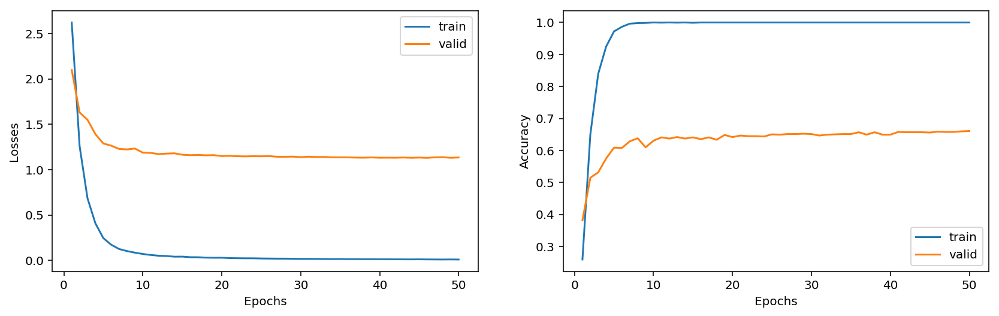

In [44]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 4))
ax[0].plot(range(1, NB_EPOCHS + 1), history_bottleneck['loss'], label='train')
ax[0].plot(range(1, NB_EPOCHS + 1), history_bottleneck['val_loss'], label='valid')
_ = ax[0].set(xlabel='Epochs', ylabel='Losses')
_ = ax[0].legend(loc='best')
ax[1].plot(range(1, NB_EPOCHS + 1), history_bottleneck['acc'], label='train')
ax[1].plot(range(1, NB_EPOCHS + 1), history_bottleneck['val_acc'], label='valid')
_ = ax[1].set(xlabel='Epochs', ylabel='Accuracy')
_ = ax[1].legend(loc='best')

### Visualizing Predictions from the Top Model for the Bottleneck Features:

In [45]:
import pickle

with open('models/index_to_class.pickle', 'rb') as f:
    index_to_class = pickle.load(f)

In [46]:
from keras.models import load_model
# build the inceptionv3 network
bottleneck_base_inceptionv3_model = InceptionV3(include_top=False, weights='imagenet', input_shape=input_shape)
bottleneck_top_model = load_model('models/bottleneck_top_model.h5')

In [47]:
import pandas as pd
train_labels_df = pd.read_csv('data/train.csv')
test_labels_df = pd.read_csv('data/test.csv')

In [48]:
## set path for images
TRAIN_IMG_PATH = 'data/train_img/'
TEST_IMG_PATH = 'data/test_img/'

In [49]:
from keras.preprocessing import image
from keras.models import load_model

from PIL import Image

def predict(img, target_size=(IMG_WIDTH, IMG_HEIGHT)):
    """Run model prediction on image
    Args:
    model: keras model
    img: PIL format image
    target_size: (w,h) tuple
    Returns:
    list of predicted labels and their probabilities
    """
    if img.size != target_size:
        img = img.resize(target_size)

    x = image.img_to_array(img)
    #x = x / 255
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    
    bottleneck_features = bottleneck_base_inceptionv3_model.predict(x)
    preds = bottleneck_top_model.predict(bottleneck_features)  
    #preds = model.predict(x)
    # Although one image but preds is returned as an array of one element, so we need preds[0]
    return np.argmax(preds[0])
    #return preds[0]

**Visualizing Predictions on Random Training Samples:**

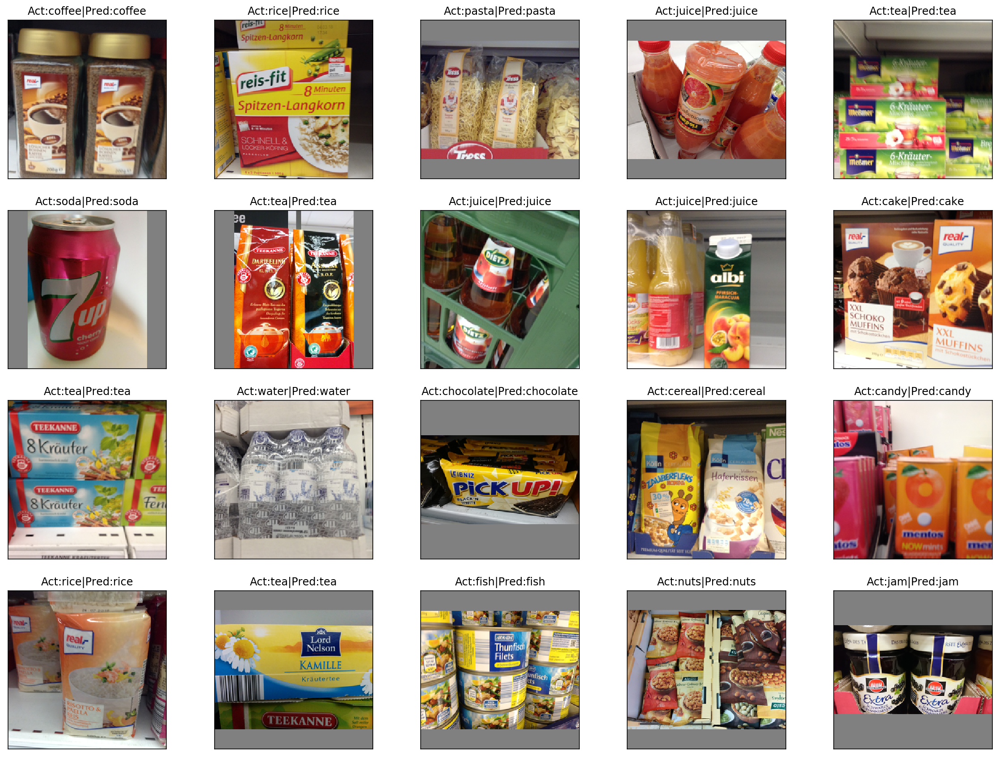

In [50]:
import cv2
fig = plt.figure(figsize=(20, 15))
nrows, ncols = 4, 5
for i, row in enumerate(train_labels_df.sample(nrows * ncols, random_state=seed).itertuples(index=False)):
    ax = fig.add_subplot(nrows, ncols, i + 1, xticks=[], yticks=[])
    img_path, img_label = TRAIN_IMG_PATH + row[0] + '.png', row[1]
    pred = predict(Image.open(img_path))
    img = cv2.imread(img_path)
    ax.imshow(cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), (256, 256)))
    ax.set_title('Act:{0}|Pred:{1}'.format(img_label, index_to_class[pred]))    

**Visualizing Predictions on Random Testing Samples:**

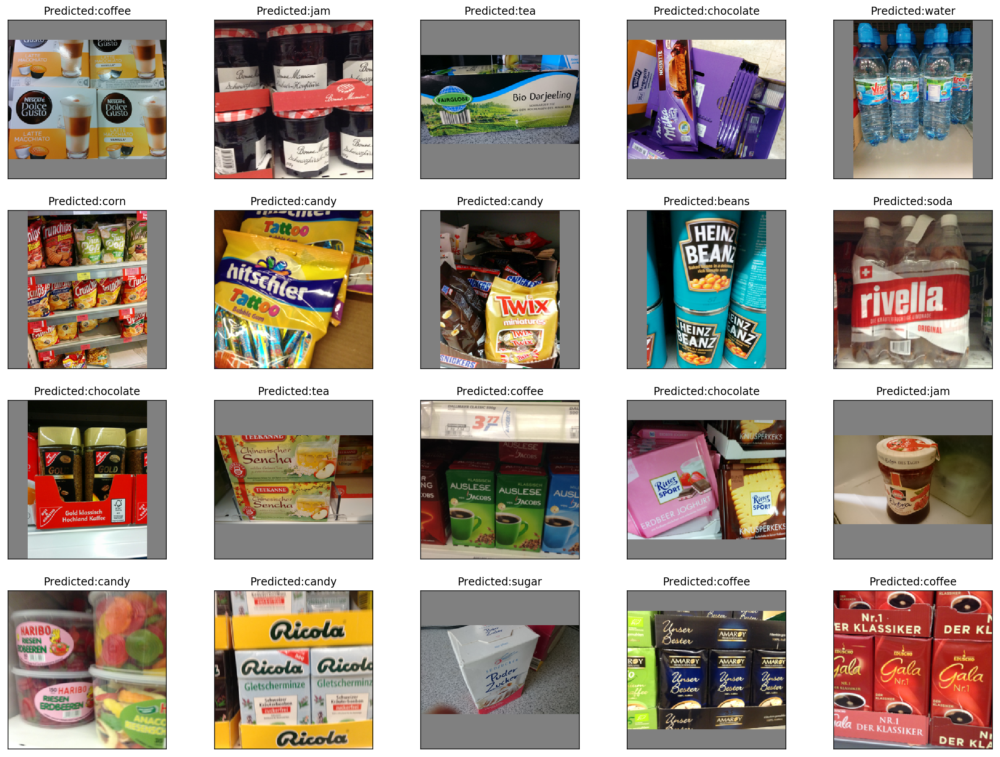

In [51]:
import cv2
fig = plt.figure(figsize=(20, 15))
nrows, ncols = 4, 5
for i, row in enumerate(test_labels_df.sample(nrows * ncols, random_state=seed).itertuples(index=False)):
    ax = fig.add_subplot(nrows, ncols, i + 1, xticks=[], yticks=[])
    img_path = TEST_IMG_PATH + row[0] + '.png'
    pred = predict(Image.open(img_path))
    img = cv2.imread(img_path)
    ax.imshow(cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), (256, 256)))
    ax.set_title('Predicted:{1}'.format(img_label, index_to_class[pred]))

### Generate Predictions from the Top Model for the Bottleneck Features:

In [52]:
test_generator = datagen.flow_from_directory(
        KERAS_DATAGEN_TEST_IMG_PATH,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        batch_size=BATCH_SIZE,
        class_mode=None, # this means our generator will only yield batches of data, no labels
        shuffle=False)   # our data will be in order

Found 1732 images belonging to 1 classes.


In [53]:
NB_TEST_SAMPLES = len(test_generator.filenames)

In [54]:
NB_TEST_SAMPLES

1732

In [55]:
bottleneck_features = bottleneck_base_inceptionv3_model.predict_generator(test_generator, np.ceil(float(NB_TEST_SAMPLES) / float(BATCH_SIZE)))  

In [56]:
bottleneck_features.shape

(1732, 8, 8, 2048)

In [57]:
top_model_predictions = bottleneck_top_model.predict(bottleneck_features)

In [58]:
top_model_predictions.shape

(1732, 25)

In [59]:
pred_labels = [index_to_class[np.argmax(pred)] for pred in top_model_predictions]

In [60]:
# make submission
sub_bottleneck_features_df = pd.DataFrame({'image_id':test_labels_df['image_id'], 'label':pred_labels})
sub_bottleneck_features_df.to_csv('submissions/sub_bottleneck_features.csv', index=False)

## Fine-tuning the top layers of a a pre-trained network:

To further improve our previous result, we can try to "fine-tune" the last convolutional block of the InceptionV3 model alongside the top-level classifier. Fine-tuning consist in starting from a trained network, then re-training it on a new dataset using very small weight updates. In our case, this can be done in 3 steps:

- instantiate the convolutional base of InceptionV3 and load its weights
- add our previously defined fully-connected model on top, and load its weights
- freeze the layers of the InceptionV3 model up to the last convolutional block

![](images/vgg16_modified.png)

Note that:

- in order to perform fine-tuning, all layers should start with properly trained weights: for instance we should not slap a randomly initialized fully-connected network on top of a pre-trained convolutional base. This is because the large gradient updates triggered by the randomly initialized weights would wreck the learned weights in the convolutional base. In our case this is why we first train the top-level classifier, and only then start fine-tuning convolutional weights alongside it.
- we choose to only fine-tune the last convolutional block rather than the entire network in order to prevent overfitting, since the entire network would have a very large entropic capacity and thus a strong tendency to overfit. The features learned by low-level convolutional blocks are more general, less abstract than those found higher-up, so it is sensible to keep the first few blocks fixed (more general features) and only fine-tune the last one (more specialized features).
- fine-tuning should be done with a very slow learning rate, and typically with the SGD optimizer rather than an adaptative learning rate optimizer such as RMSProp. This is to make sure that the magnitude of the updates stays very small, so as not to wreck the previously learned features.

### Load the top model of the Bottleneck Features model:

In [61]:
# build the inceptionv3 network
fine_tune_inceptionv3_base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)

In [62]:
# note that it is necessary to start with a fully-trained classifier, including the top classifier,
# in order to successfully do fine-tuning
bottleneck_top_model = load_model('models/bottleneck_top_model.h5')

In [63]:
# add the model on top of the convolutional base
fine_tune_model = Model(inputs=fine_tune_inceptionv3_base_model.input, outputs=bottleneck_top_model(fine_tune_inceptionv3_base_model.output))

In [64]:
print(fine_tune_model.summary())

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_189 (Conv2D)             (None, 149, 149, 32) 864         input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_189 (BatchN (None, 149, 149, 32) 96          conv2d_189[0][0]                 
__________________________________________________________________________________________________
activation_189 (Activation)     (None, 149, 149, 32) 0           batch_normalization_189[0][0]    
__________________________________________________________________________________________________
conv2d_190

In [65]:
for i, layer in enumerate(fine_tune_model.layers):
    print('Layer {0}: Name: {1}'.format(i, layer.name))

Layer 0: Name: input_4
Layer 1: Name: conv2d_189
Layer 2: Name: batch_normalization_189
Layer 3: Name: activation_189
Layer 4: Name: conv2d_190
Layer 5: Name: batch_normalization_190
Layer 6: Name: activation_190
Layer 7: Name: conv2d_191
Layer 8: Name: batch_normalization_191
Layer 9: Name: activation_191
Layer 10: Name: max_pooling2d_9
Layer 11: Name: conv2d_192
Layer 12: Name: batch_normalization_192
Layer 13: Name: activation_192
Layer 14: Name: conv2d_193
Layer 15: Name: batch_normalization_193
Layer 16: Name: activation_193
Layer 17: Name: max_pooling2d_10
Layer 18: Name: conv2d_197
Layer 19: Name: batch_normalization_197
Layer 20: Name: activation_197
Layer 21: Name: conv2d_195
Layer 22: Name: conv2d_198
Layer 23: Name: batch_normalization_195
Layer 24: Name: batch_normalization_198
Layer 25: Name: activation_195
Layer 26: Name: activation_198
Layer 27: Name: average_pooling2d_19
Layer 28: Name: conv2d_194
Layer 29: Name: conv2d_196
Layer 30: Name: conv2d_199
Layer 31: Name: con

**Freeze some of the lower layers of the InceptionV3 network:**

In [66]:
# set the first 15 layers (up to the last conv block)
# to non-trainable (weights will not be updated)
for layer in fine_tune_model.layers[:172]:
    layer.trainable = False

**Train the Fine Tune Model:**

In [67]:
# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
fine_tune_model.compile(loss='categorical_crossentropy', 
                        optimizer=SGD(lr=1e-4, momentum=0.9), 
                        metrics=['accuracy'])

In [68]:
# prepare data augmentation configuration
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    shear_range=0.2,
    zoom_range=0.2)

valid_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_directory(
    KERAS_DATAGEN_TRAIN_IMG_PATH,
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True)

validation_generator = valid_datagen.flow_from_directory(
    KERAS_DATAGEN_VALID_IMG_PATH,
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True)

Found 2154 images belonging to 25 classes.
Found 1061 images belonging to 25 classes.


In [69]:
NB_EPOCHS = 50
BATCH_SIZE = 32

In [70]:
callbacks = [EarlyStopping(monitor='val_loss',
                               patience=8,
                               verbose=1,
                               min_delta=1e-4),
             ReduceLROnPlateau(monitor='val_loss',
                               factor=0.1,
                               patience=4,
                               verbose=1,
                               epsilon=1e-4),
             ModelCheckpoint(monitor='val_loss',
                             filepath='models/fine_tune_model.h5',
                             save_best_only=True,
                             save_weights_only=False)]

In [71]:
# fine-tune the model
history_fine_tune = fine_tune_model.fit_generator(
    train_generator,
    steps_per_epoch=NB_TRAIN_SAMPLES // BATCH_SIZE,
    epochs=NB_EPOCHS,
    validation_data=validation_generator,
    validation_steps=NB_VALID_SAMPLES // BATCH_SIZE,
    callbacks=callbacks,
    shuffle=True,
    verbose=2).history

Epoch 1/50
 - 103s - loss: 1.9315 - acc: 0.4499 - val_loss: 1.2184 - val_acc: 0.6192
Epoch 2/50
 - 68s - loss: 1.2818 - acc: 0.6240 - val_loss: 1.2682 - val_acc: 0.6041
Epoch 3/50
 - 67s - loss: 0.9426 - acc: 0.7261 - val_loss: 1.2311 - val_acc: 0.6268
Epoch 4/50
 - 75s - loss: 0.7060 - acc: 0.7922 - val_loss: 1.2044 - val_acc: 0.6334
Epoch 5/50
 - 74s - loss: 0.5554 - acc: 0.8400 - val_loss: 1.1571 - val_acc: 0.6550
Epoch 6/50
 - 74s - loss: 0.4528 - acc: 0.8747 - val_loss: 1.1076 - val_acc: 0.6616
Epoch 7/50
 - 67s - loss: 0.3693 - acc: 0.9043 - val_loss: 1.1335 - val_acc: 0.6682
Epoch 8/50
 - 75s - loss: 0.2995 - acc: 0.9216 - val_loss: 1.0842 - val_acc: 0.6748
Epoch 9/50
 - 74s - loss: 0.2401 - acc: 0.9419 - val_loss: 1.0645 - val_acc: 0.6833
Epoch 10/50
 - 74s - loss: 0.2013 - acc: 0.9566 - val_loss: 1.0328 - val_acc: 0.6965
Epoch 11/50
 - 74s - loss: 0.1907 - acc: 0.9553 - val_loss: 1.0249 - val_acc: 0.6946
Epoch 12/50
 - 74s - loss: 0.1571 - acc: 0.9616 - val_loss: 1.0089 - val_

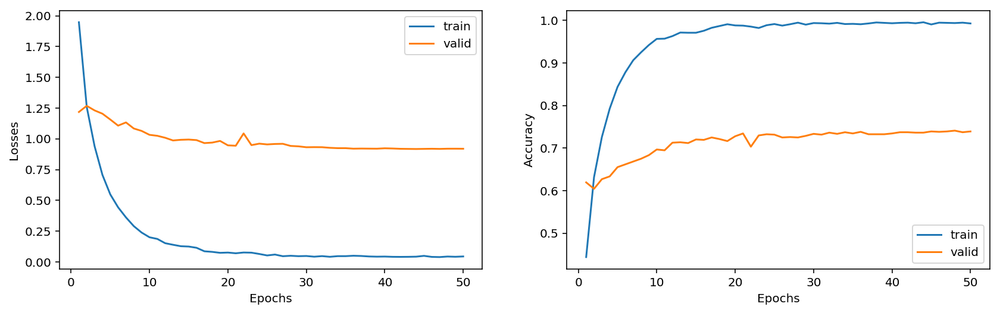

In [72]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 4))
ax[0].plot(range(1, NB_EPOCHS + 1), history_fine_tune['loss'], label='train')
ax[0].plot(range(1, NB_EPOCHS + 1), history_fine_tune['val_loss'], label='valid')
_ = ax[0].set(xlabel='Epochs', ylabel='Losses')
_ = ax[0].legend(loc='best')
ax[1].plot(range(1, NB_EPOCHS + 1), history_fine_tune['acc'], label='train')
ax[1].plot(range(1, NB_EPOCHS + 1), history_fine_tune['val_acc'], label='valid')
_ = ax[1].set(xlabel='Epochs', ylabel='Accuracy')
_ = ax[1].legend(loc='best')

In [73]:
#fine_tune_model.save('models/fine_tune_model.h5')
#fine_tune_model.save_weights('models/fine_tune_model_weights.h5')

### Visualizing Predictions from the Fine Tunes Model:

In [74]:
import pickle

with open('models/index_to_class.pickle', 'rb') as f:
    index_to_class = pickle.load(f)

In [75]:
index_to_class

{0: 'beans',
 1: 'cake',
 2: 'candy',
 3: 'cereal',
 4: 'chips',
 5: 'chocolate',
 6: 'coffee',
 7: 'corn',
 8: 'fish',
 9: 'flour',
 10: 'honey',
 11: 'jam',
 12: 'juice',
 13: 'milk',
 14: 'nuts',
 15: 'oil',
 16: 'pasta',
 17: 'rice',
 18: 'soda',
 19: 'spices',
 20: 'sugar',
 21: 'tea',
 22: 'tomatosauce',
 23: 'vinegar',
 24: 'water'}

In [76]:
from keras.models import load_model
fine_tune_model = load_model('models/fine_tune_model.h5')

In [77]:
import pandas as pd
train_labels_df = pd.read_csv('data/train.csv')
test_labels_df = pd.read_csv('data/test.csv')

In [78]:
## set path for images
TRAIN_IMG_PATH = 'data/train_img/'
TEST_IMG_PATH = 'data/test_img/'

In [79]:
from keras.preprocessing import image
from keras.models import load_model

from PIL import Image

def predict(model, img, target_size=(IMG_WIDTH, IMG_HEIGHT)):
    """Run model prediction on image
    Args:
    model: keras model
    img: PIL format image
    target_size: (w,h) tuple
    Returns:
    list of predicted labels and their probabilities
    """
    if img.size != target_size:
        img = img.resize(target_size)

    x = image.img_to_array(img)
    #x = x / 255
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    
    preds = model.predict(x)
    # Although one image but preds is returned as an array of one element, so we need preds[0]
    return np.argmax(preds[0])
    #return preds[0]

**Visualizing Predictions on Random Training Samples:**

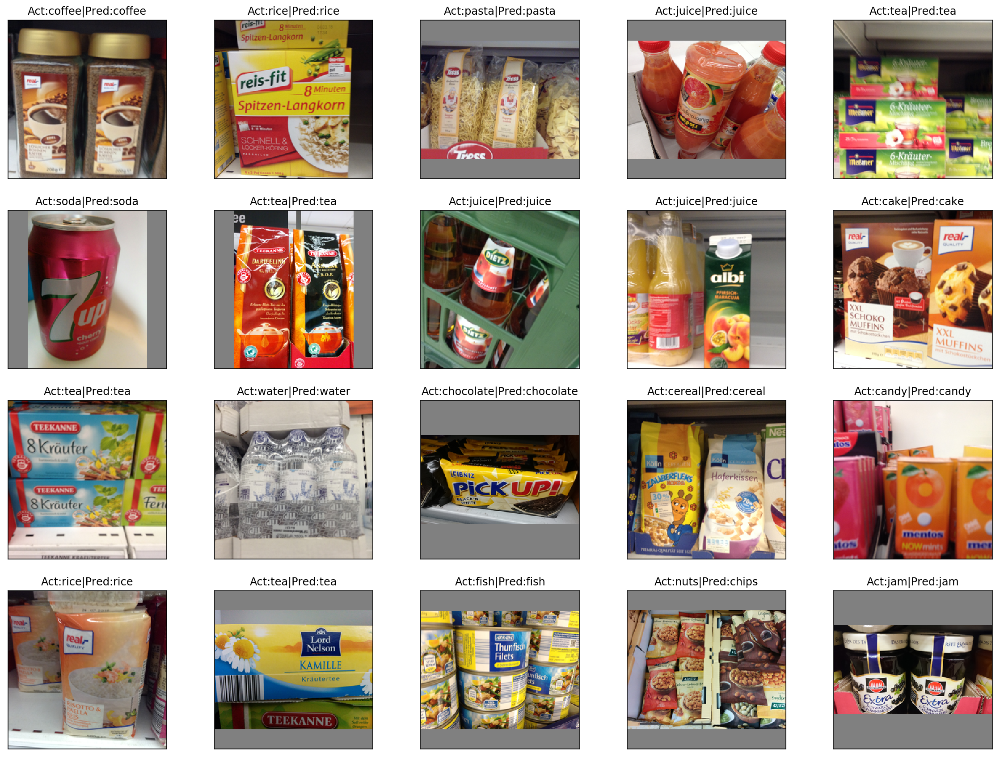

In [80]:
import cv2
fig = plt.figure(figsize=(20, 15))
nrows, ncols = 4, 5
for i, row in enumerate(train_labels_df.sample(nrows * ncols, random_state=seed).itertuples(index=False)):
    ax = fig.add_subplot(nrows, ncols, i + 1, xticks=[], yticks=[])
    img_path, img_label = TRAIN_IMG_PATH + row[0] + '.png', row[1]
    pred = predict(fine_tune_model, Image.open(img_path))
    img = cv2.imread(img_path)
    ax.imshow(cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), (256, 256)))
    ax.set_title('Act:{0}|Pred:{1}'.format(img_label, index_to_class[pred]))    

**Visualizing Predictions on Random Testing Samples:**

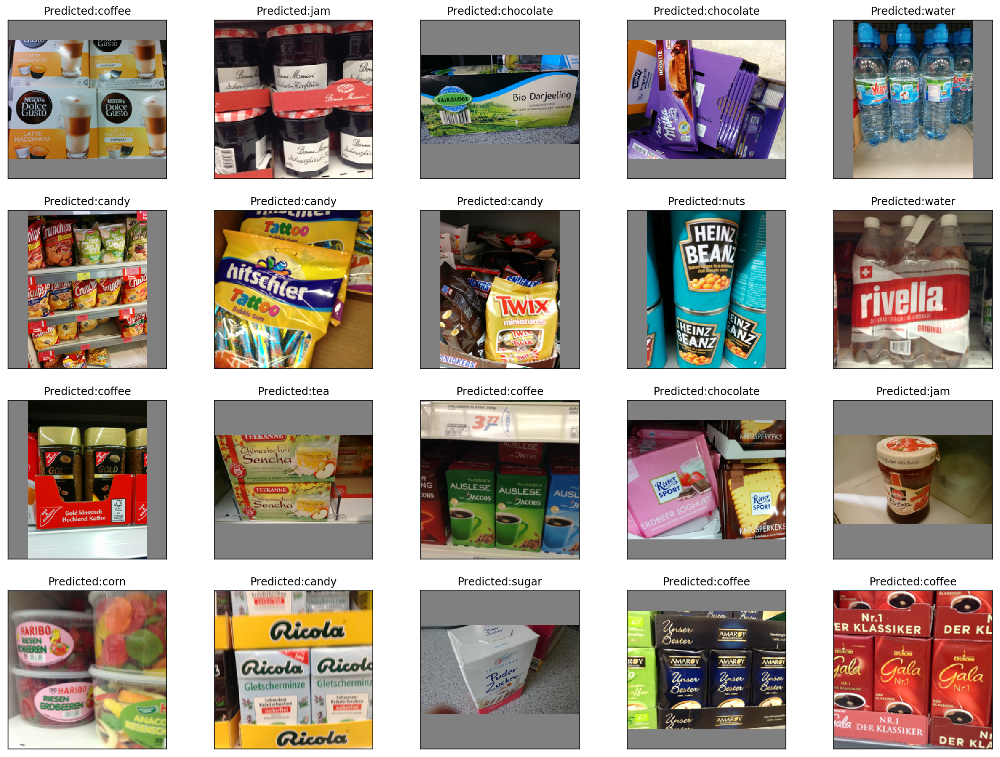

In [81]:
import cv2
fig = plt.figure(figsize=(20, 15))
nrows, ncols = 4, 5
for i, row in enumerate(test_labels_df.sample(nrows * ncols, random_state=seed).itertuples(index=False)):
    ax = fig.add_subplot(nrows, ncols, i + 1, xticks=[], yticks=[])
    img_path = TEST_IMG_PATH + row[0] + '.png'
    pred = predict(fine_tune_model, Image.open(img_path))
    img = cv2.imread(img_path)
    ax.imshow(cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), (256, 256)))
    ax.set_title('Predicted:{1}'.format(img_label, index_to_class[pred]))

### Generate predictions from Fine Tuned Model:

In [82]:
# preprocess_input
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
#test_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=imagenet_utils.preprocess_input)

In [83]:
test_generator = test_datagen.flow_from_directory(
        KERAS_DATAGEN_TEST_IMG_PATH,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        batch_size=BATCH_SIZE,
        class_mode=None, # this means our generator will only yield batches of data, no labels
        shuffle=False)   # our data will be in order

Found 1732 images belonging to 1 classes.


In [84]:
NB_TEST_SAMPLES = len(test_generator.filenames)

In [85]:
NB_TEST_SAMPLES

1732

In [86]:
fine_tune_predictions = fine_tune_model.predict_generator(test_generator, np.ceil(float(NB_TEST_SAMPLES) / float(BATCH_SIZE)))  

In [87]:
fine_tune_predictions.shape

(1732, 25)

In [88]:
pred_labels = [index_to_class[np.argmax(pred)] for pred in fine_tune_predictions]

In [89]:
# make submission
sub_fine_tune_model_df = pd.DataFrame({'image_id':test_labels_df['image_id'], 'label':pred_labels})
sub_fine_tune_model_df.to_csv('submissions/sub_fine_tune_model.csv', index=False)